<a href="https://colab.research.google.com/github/dewamardana/Pengantar-Pemrosesan-Data-Multimedia/blob/main/Kode_Fix_Klasifikasi_Telur_Rebus_Dengan_GLCM_dan_SVM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Menghubungkan Colab Ke Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Instaling Library Yang Diperlukan

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

import cv2
import os

import cv2
import os
import re
import sys
from skimage.feature import graycomatrix, graycoprops

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
import pickle


In [ ]:
!pip install pickle-mixin

##2. Melakukan Augmentasi Pada Dataset
Rotate dan Flip

In [ ]:
# Fungsi untuk memperbesar dan menyimpan gambar
def augment_and_save_image(img, folder, base_filename, output_dir):
    # Simpan gambar asli
    cv2.imwrite(os.path.join(output_dir, folder, base_filename), img)

    # Putar dan flip
    for angle in range(0, 360, 10):
        if angle > 0:  # Putar hanya jika sudut tidak nol
            rot_matrix = cv2.getRotationMatrix2D((img.shape[1] / 2, img.shape[0] / 2), angle, 1.0)
            rotated_img = cv2.warpAffine(img, rot_matrix, (img.shape[1], img.shape[0]))
            rot_filename = f"{base_filename.split('.')[0]}_rot{angle}.png"
            cv2.imwrite(os.path.join(output_dir, folder, rot_filename), rotated_img)

    # Flip gambar
    for flip_code in [1, 0, -1]:  # 1: horizontal, 0: vertikal, -1: keduanya
        flipped_img = cv2.flip(img, flip_code)
        flip_filename = f"{base_filename.split('.')[0]}_flip{flip_code}.png"
        cv2.imwrite(os.path.join(output_dir, folder, flip_filename), flipped_img)

# -------------------- Muat Dataset dan Augmentasi ------------------------
dataset_dir = "/content/drive/MyDrive/Colab/Testing"
output_dir = "/content/drive/MyDrive/Colab/Augmentasi"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for folder in os.listdir(dataset_dir):
    folder_path = os.path.join(dataset_dir, folder)
    if os.path.isdir(folder_path):
        for filename in os.listdir(folder_path):
            img_path = os.path.join(folder_path, filename)
            if os.path.isfile(img_path) and any(img_path.endswith(ext) for ext in ['.png', '.jpg', '.jpeg']):
                img = cv2.imread(img_path)
                if img is None:
                    continue

                base_filename = filename

                output_folder = os.path.join(output_dir, folder)
                if not os.path.exists(output_folder):
                    os.makedirs(output_folder)

                augment_and_save_image(img, folder, base_filename, output_dir)



##3. Preprocessing
Grayscale, Cropping, Resize, Labeling

In [ ]:
# -------------------- Fungsi Utilitas ------------------------
def normalize_label(folder):
    return folder

def normalize_desc(folder, filename):
    text = f"{folder} - {filename}"
    text = re.sub(r'\d+', '', text)
    text = text.replace(".", "")
    text = text.strip()
    return text

# -------------------- Muat Dataset dan Augmentasi ------------------------
dataset_dir = "/content/drive/MyDrive/Colab/Augmentasi"


imgs = []  # list matriks gambar
labels = []
descs = []


for folder in os.listdir(dataset_dir):
    folder_path = os.path.join(dataset_dir, folder)
    if os.path.isdir(folder_path):
        for filename in os.listdir(folder_path):
            img_path = os.path.join(folder_path, filename)
            if os.path.isfile(img_path) and any(img_path.endswith(ext) for ext in ['.png', '.jpg', '.jpeg']):
                img = cv2.imread(img_path)
                if img is None:
                    continue

                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                h, w = gray.shape
                ymin, ymax, xmin, xmax = h//3, h*2//3, w//3, w*2//3
                crop = gray[ymin:ymax, xmin:xmax]
                resize = cv2.resize(crop, (0,0), fx=0.5, fy=0.5)

                imgs.append(resize)
                labels.append(normalize_label(folder))
                descs.append(filename)  # Gunakan nama file asli secara langsung




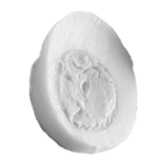

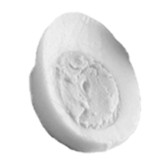

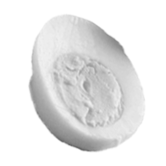

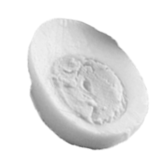

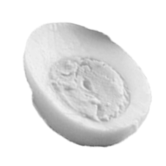

...

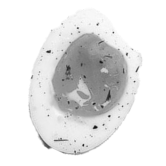

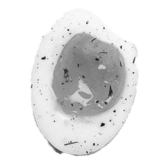

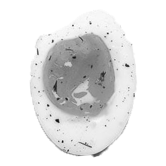

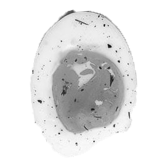

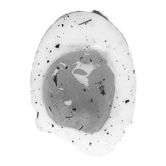

In [ ]:
from google.colab.patches import cv2_imshow
i = 0
for i in range(len(labels)):
  cv2_imshow(imgs[i])

##3. Ekstraksi Fitur GLCM


In [ ]:
# ----------------- calculate greycomatrix() & greycoprops() for angle 0, 45, 90, 135 ----------------------------------
def calc_glcm_all_agls(img, label, props, dists=[1], agls=[0, np.pi/4, np.pi/2, 3*np.pi/4], lvl=256, sym=True, norm=True):

    glcm = graycomatrix(img,
                        distances=dists,
                        angles=agls,
                        levels=lvl,
                        symmetric=sym,
                        normed=norm)
    feature = []
    glcm_props = [propery for name in props for propery in graycoprops(glcm, name)[0]]
    for item in glcm_props:
            feature.append(item)
    feature.append(label)

    return feature


# ----------------- call calc_glcm_all_agls() for all properties ----------------------------------
properties = ['correlation', 'homogeneity', 'contrast','energy']

glcm_all_agls = []
for img, label in zip(imgs, labels):
    glcm_all_agls.append(
            calc_glcm_all_agls(img,
                                label,
                                props=properties)
                            )

columns = []
angles = ['0', '45', '90','135']
for name in properties :
    for ang in angles:
        columns.append(name + "_" + ang)

columns.append("label")

##4. Menyimpan Ekstraksi Fitur Ke File CSV

In [ ]:
# Create the pandas DataFrame for GLCM features data
glcm_df = pd.DataFrame(glcm_all_agls,
                      columns = columns)

# Menyimpan DataFrame ke dalam file CSV
glcm_df.to_csv('/content/drive/MyDrive/Colab/Hasil/GLCM_Telur.csv',index=False)

##5. Membaca dataset dari file CSV

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab/GLCM_Telur.csv')


##6. Data Understanding

In [ ]:
print("Data Shape : ", df.shape)

Data Shape :  (3705, 17)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3705 entries, 0 to 3704
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   correlation_0    3705 non-null   float64
 1   correlation_45   3705 non-null   float64
 2   correlation_90   3705 non-null   float64
 3   correlation_135  3705 non-null   float64
 4   homogeneity_0    3705 non-null   float64
 5   homogeneity_45   3705 non-null   float64
 6   homogeneity_90   3705 non-null   float64
 7   homogeneity_135  3705 non-null   float64
 8   contrast_0       3705 non-null   float64
 9   contrast_45      3705 non-null   float64
 10  contrast_90      3705 non-null   float64
 11  contrast_135     3705 non-null   float64
 12  energy_0         3705 non-null   float64
 13  energy_45        3705 non-null   float64
 14  energy_90        3705 non-null   float64
 15  energy_135       3705 non-null   float64
 16  label            3705 non-null   int64  
dtypes: float64(16)

In [ ]:
df[['correlation_0','homogeneity_0', 'contrast_0','energy_0']].describe()
df.label.value_counts()

label
1    1365
3    1365
2     975
Name: count, dtype: int64

##7. Cleaning Data


Mengecek Data Kosong

In [ ]:
df.isnull().sum()

correlation_0      0
correlation_45     0
correlation_90     0
correlation_135    0
homogeneity_0      0
homogeneity_45     0
homogeneity_90     0
homogeneity_135    0
contrast_0         0
contrast_45        0
contrast_90        0
contrast_135       0
energy_0           0
energy_45          0
energy_90          0
energy_135         0
label              0
dtype: int64

Mengecek Data Duplikat

In [ ]:
df.duplicated().sum()
df.drop_duplicates(inplace=True)

##8. Exploratory Data Analysis ( EDA )


Histogram Distribusi Dari Setiap Kolom

Histogram adalah sebuah jenis grafik yang digunakan untuk merepresentasikan distribusi data numerik. Grafik ini terdiri dari batang-batang yang masing-masing mewakili kelompok (atau interval) dari nilai-nilai data. Tinggi setiap batang menunjukkan frekuensi atau jumlah kejadian nilai-nilai data dalam kelompok tersebut.

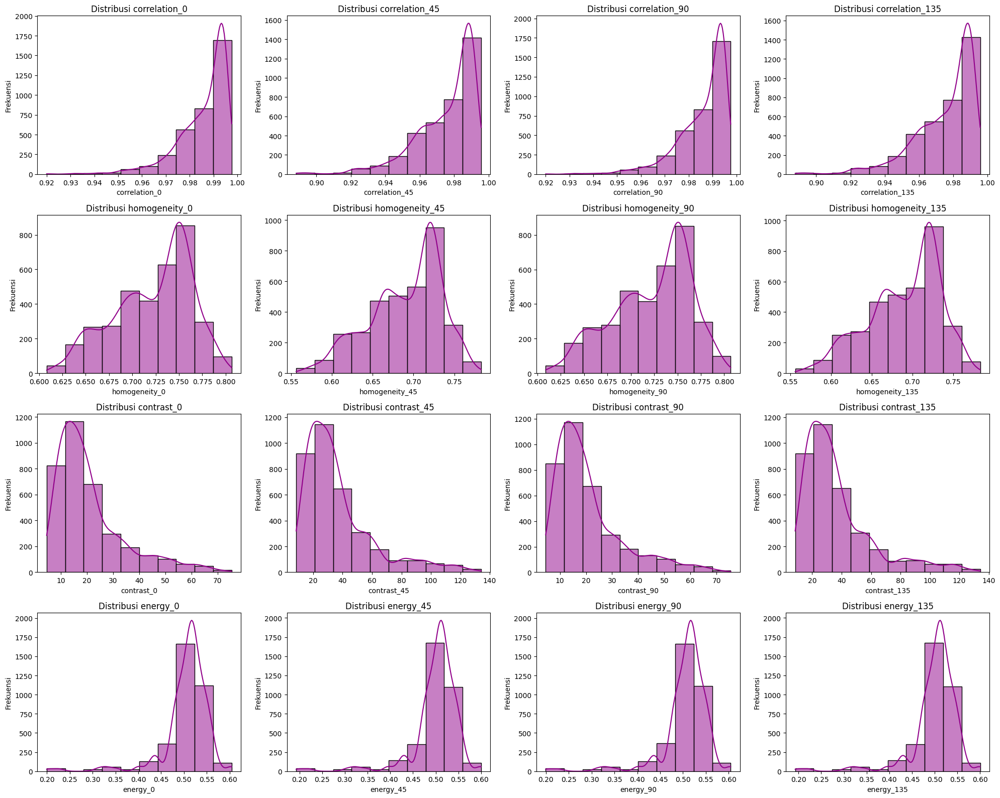

In [ ]:
# Misalkan df adalah DataFrame Anda dengan 16 kolom yang ingin Anda plot distribusinya
columns_to_plot = [
    'correlation_0', 'correlation_45', 'correlation_90', 'correlation_135',
    'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135',
    'contrast_0', 'contrast_45', 'contrast_90', 'contrast_135',
    'energy_0', 'energy_45', 'energy_90', 'energy_135'
]

# Tentukan ukuran grid
n_rows = 4
n_cols = 4

# Buat figure dan axis
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 16))

# Flatten axis untuk memudahkan iterasi
axes = axes.flatten()

# Iterasi melalui setiap kolom dan buat plot
for i, col in enumerate(columns_to_plot):
    sns.histplot(data=df, x=col, bins=10, kde=True, color='#91008a', ax=axes[i])
    axes[i].set_title(f'Distribusi {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frekuensi')

# Mengatur layout agar lebih rapi
plt.tight_layout()
plt.show()


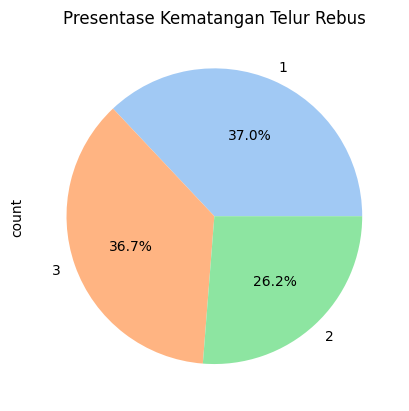

In [ ]:
sns.set_palette('pastel')
df['label'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Presentase Kematangan Telur Rebus')
plt.show()

In [ ]:
df.corr()


,correlation_0,correlation_45,correlation_90,correlation_135,homogeneity_0,homogeneity_45,homogeneity_90,homogeneity_135,contrast_0,contrast_45,contrast_90,contrast_135,energy_0,energy_45,energy_90,energy_135,label
correlation_0,1.000000,0.887544,0.766918,0.888577,-0.168903,-0.249221,-0.247751,-0.245307,-0.116450,-0.013345,0.049459,-0.015165,-0.271991,-0.273771,-0.276320,-0.273224,-0.658595
correlation_45,0.887544,1.000000,0.886885,0.793673,-0.195740,-0.204972,-0.199723,-0.268534,-0.044951,-0.095780,-0.040814,0.039183,-0.278088,-0.275132,-0.278633,-0.280271,-0.673725
correlation_90,0.766918,0.886885,1.000000,0.886089,-0.248348,-0.246360,-0.168291,-0.250951,0.048088,-0.011096,-0.111317,-0.012342,-0.276815,-0.273820,-0.272693,-0.274498,-0.660796
correlation_135,0.888577,0.793673,0.886089,1.000000,-0.198842,-0.267202,-0.194341,-0.204323,-0.047649,0.038688,-0.042871,-0.099050,-0.279160,-0.280874,-0.278862,-0.275865,-0.673365
homogeneity_0,-0.168903,-0.195740,-0.248348,-0.198842,1.000000,0.959264,0.925672,0.959312,-0.742699,-0.730102,-0.678552,-0.720858,0.623181,0.620979,0.620266,0.620921,0.387970
homogeneity_45,-0.249221,-0.204972,-0.246360,-0.267202,0.959264,1.000000,0.958170,0.941564,-0.693665,-0.736879,-0.699964,-0.689985,0.670531,0.671625,0.670674,0.668626,0.427478
homogeneity_90,-0.247751,-0.199723,-0.168291,-0.194341,0.925672,0.958170,1.000000,0.958235,-0.678662,-0.723847,-0.745580,-0.730334,0.616468,0.617271,0.619728,0.617357,0.387990
homogeneity_135,-0.245307,-0.268534,-0.250951,-0.204323,0.959312,0.941564,0.958235,1.000000,-0.700317,-0.690916,-0.692906,-0.735236,0.670181,0.668231,0.670290,0.671260,0.426704
contrast_0,-0.116450,-0.044951,0.048088,-0.047649,-0.742699,-0.693665,-0.678662,-0.700317,1.000000,0.904205,0.795712,0.904477,-0.261287,-0.258157,-0.256657,-0.258993,-0.324648
contrast_45,-0.013345,-0.095780,-0.011096,0.038688,-0.730102,-0.736879,-0.723847,-0.690916,0.904205,1.000000,0.902975,0.834816,-0.261245,-0.262998,-0.260751,-0.258195,-0.341638


<Axes: >

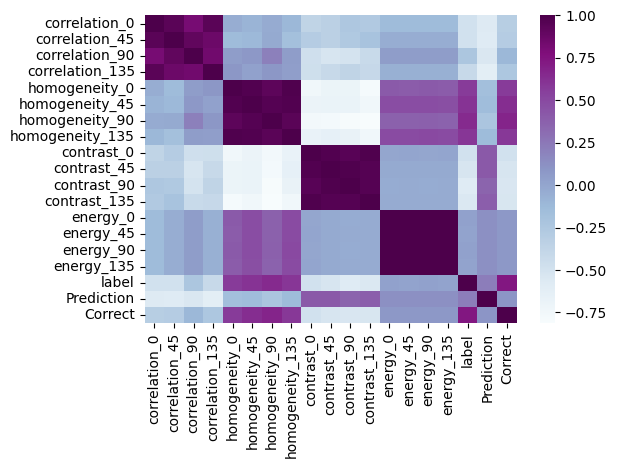

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(df.corr(), cmap='BuPu')

##9. Prepraration Data

In [ ]:
X = df.drop(columns=['label'])
Y = df['label']

print("x : ",X.shape)
print("y : ",Y.shape)

x :  (3525, 16)
y :  (3525,)


In [ ]:
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)



In [ ]:
pickle.dump(scaler, open('scaler.sav', 'wb'))

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size=0.2, random_state=42)

##10. Modeling & Evaluation

###Model Dengan Tuning Hyperparameter

In [ ]:
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}

# Create a GridSearchCV object
grid = GridSearchCV(SVC(), param_grid, refit=True, verbose=2, cv=5)
grid.fit(x_train, y_train)
print("Best parameters found: ", grid.best_params_)

clf = grid.best_estimator_
clf.fit(x_train, y_train)

y_pred = clf.predict(x_test)
clf_acc = accuracy_score(y_pred, y_test)

# Print classification report and accuracy
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Akurasi SVM : {:.2f}%".format(clf_acc * 100))

Fitting 5 folds for each of 64 candidates, totalling 320 fits
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.1s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.3s
[CV] END .........................C=0.1, gamma=

### Model Parameter Default

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size=0.2, random_state=42)

clf = SVC(kernel='linear')
clf.fit(x_train, y_train)

y_pred = clf.predict(x_test)
CLF_acc = accuracy_score(y_pred, y_test)

print(classification_report(y_test, y_pred))
print("Akurasi SVM : {:.2f}%".format(CLF_acc*100))

              precision    recall  f1-score   support

           1       0.84      0.86      0.85       284
           2       0.75      0.74      0.74       175
           3       1.00      0.98      0.99       246

    accuracy                           0.87       705
   macro avg       0.86      0.86      0.86       705
weighted avg       0.87      0.87      0.87       705

Akurasi SVM : 87.23%


###Confusion Matrix

Confusion Matrix:


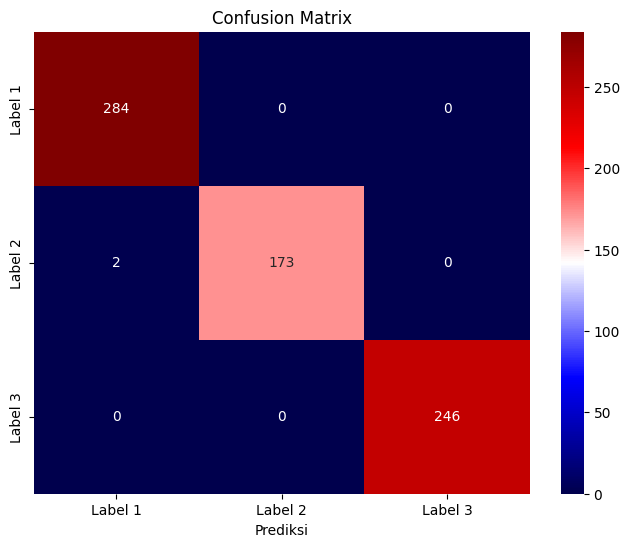

In [ ]:
cm = confusion_matrix(y_test, y_pred)

# Menampilkan confusion matrix di Streamlit
print("Confusion Matrix:")
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='seismic', fmt='g',
            xticklabels=['Label 1', 'Label 2', 'Label 3'],
            yticklabels=['Label 1', 'Label 2', 'Label 3'])
plt.xlabel('Prediksi')
plt.title('Confusion Matrix')
plt.show()

##Menyimpan Model


In [ ]:
filename = 'trained_model.sav'
pickle.dump(clf, open(filename, 'wb'))

## 11. Preprocessing Data Testing
Grayscale, Croping, Resize, Labeling

In [ ]:
# -------------------- Fungsi Utilitas ------------------------
def normalize_label(folder):
    return folder

def normalize_desc(folder, filename):
    text = f"{folder} - {filename}"
    text = re.sub(r'\d+', '', text)
    text = text.replace(".", "")
    text = text.strip()
    return text

# -------------------- Muat Dataset dan Augmentasi ------------------------
dataset_dir = "/content/drive/MyDrive/Colab/Testing"

imgs = []  # list matriks gambar
labels = []
descs = []

for folder in os.listdir(dataset_dir):
    folder_path = os.path.join(dataset_dir, folder)
    if os.path.isdir(folder_path):
        for filename in os.listdir(folder_path):
            img_path = os.path.join(folder_path, filename)
            if os.path.isfile(img_path) and any(img_path.endswith(ext) for ext in ['.png', '.jpg', '.jpeg']):
                img = cv2.imread(img_path)
                if img is None:
                    continue

                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                h, w = gray.shape
                ymin, ymax, xmin, xmax = h//3, h*2//3, w//3, w*2//3
                crop = gray[ymin:ymax, xmin:xmax]
                resize = cv2.resize(crop, (0,0), fx=0.5, fy=0.5)

                imgs.append(resize)
                labels.append(normalize_label(folder))
                descs.append(filename)



##12. Ekstraksi Fitur GLCM
Correlation, Homogeneity, Contrast, Energy


In [ ]:
# ----------------- calculate greycomatrix() & greycoprops() for angle 0, 45, 90, 135 ----------------------------------
def calc_glcm_all_agls(img, label, props, dists=[1], agls=[0, np.pi/4, np.pi/2, 3*np.pi/4], lvl=256, sym=True, norm=True):

    glcm = graycomatrix(img,
                        distances=dists,
                        angles=agls,
                        levels=lvl,
                        symmetric=sym,
                        normed=norm)
    feature = []
    glcm_props = [propery for name in props for propery in graycoprops(glcm, name)[0]]
    for item in glcm_props:
            feature.append(item)
    feature.append(label)

    return feature


# ----------------- call calc_glcm_all_agls() for all properties ----------------------------------
properties = ['correlation', 'homogeneity', 'contrast','energy']

glcm_all_agls = []
for img, label in zip(imgs, labels):
    glcm_all_agls.append(
            calc_glcm_all_agls(img,
                                label,
                                props=properties)
                            )

columns = []
angles = ['0', '45', '90','135']
for name in properties :
    for ang in angles:
        columns.append(name + "_" + ang)

columns.append("label")

##13. Menyimpan Ekstraksi Fitur Data Testing Ke File CSV

In [ ]:
# Create the pandas DataFrame for GLCM features data
glcm_df = pd.DataFrame(glcm_all_agls,
                      columns = columns)

#glcm_df.head(20)

# Menyimpan DataFrame ke dalam file CSV
glcm_df.to_csv('/content/drive/MyDrive/Colab/Hasil/GLCM-Testing.csv',index=False)

##14. Melakukan Testing Dan Menyimpan Hasil Testing Ke File CSV

In [ ]:
# Membaca data test dari file CSV
test_data = pd.read_csv('/content/drive/MyDrive/Colab/Hasil/GLCM-Testing.csv')

# Menyiapkan kolom untuk menyimpan hasil prediksi
test_data['Prediction'] = ''

# Melakukan prediksi untuk setiap baris data test
for index, row in test_data.iterrows():
    # Mengambil fitur dari setiap baris
    new_data = row[['correlation_0', 'correlation_45', 'correlation_90', 'correlation_135',
                    'homogeneity_0', 'homogeneity_45', 'homogeneity_90', 'homogeneity_135',
                    'contrast_0', 'contrast_45', 'contrast_90', 'contrast_135',
                    'energy_0', 'energy_45', 'energy_90', 'energy_135']].values.reshape(1, -1)

    # Lakukan scaling terhadap data baru
    scaled_new_data = scaler.transform(new_data)

    # Lakukan prediksi
    y_pred_new = clf.predict(scaled_new_data)

    # Simpan hasil prediksi ke dalam DataFrame test_data
    test_data.at[index, 'Prediction'] = y_pred_new[0]

# Simpan hasil prediksi ke dalam file CSV baru
test_data.to_csv('/content/drive/MyDrive/Colab/Hasil/GLCM-Prediksi-Awal.csv', index=False)



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but 

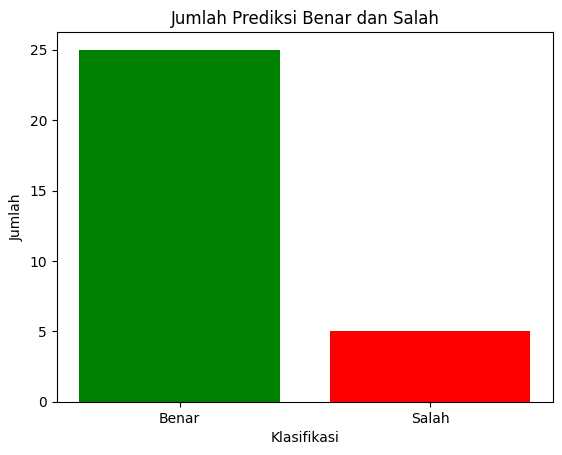

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab/Hasil/GLCM-Prediksi-Awal.csv')

df['Correct'] = df['label'] == df['Prediction']
correct_count = df['Correct'].sum()
incorrect_count = (~df['Correct']).sum()

labels = ['Benar', 'Salah']
counts = [correct_count, incorrect_count]

plt.bar(labels, counts, color=['green', 'red'])
plt.xlabel('Klasifikasi')
plt.ylabel('Jumlah')
plt.title('Jumlah Prediksi Benar dan Salah')
plt.show()
